In [ ]:
# Импортируем библиотеку для работы с графами и не только
import random
import networkx as nx
import networkx.algorithms.community as nx_comm
import numpy as np
import pandas as pd
from numpy import linalg as LA
import math

%matplotlib inline
import matplotlib.pyplot as plt

from typing import TypeVar, Generic, List, Tuple
from abc import ABC, abstractmethod
T = TypeVar('T')  # Определяем типовой переменной T

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
import random

# **PART I**

## **Извлечение графа**

In [ ]:
G = nx.Graph()

# Читаем граф
with open('/content/CollegeMsg.txt', 'r') as file:
#with open('/content/sx-mathoverflow.txt', 'r') as file:
    for line in file:
        # Split the line into source, destination, and timestamp
        source, destination, timestamp = map(int, line.split())
        # Add an edge to the graph (including timestamp)
        G.add_edge(source, destination, timestamp = timestamp)

# Базовое инфо о графе
print(G)

Graph with 1899 nodes and 13838 edges


In [ ]:
# Список компонент связности
connected_components = list(nx.connected_components(G))

# Самая крупная
largest_component = max(connected_components, key=len)
  # Удаляем петли

# Создание подграфа
F = G.subgraph(largest_component).copy()



### Для графов большой размерности

In [ ]:
loops = list(nx.selfloop_edges(F))  # Находим петли
F.remove_edges_from(loops)

## **Графическое представление G и его наибольшего подграфа**

In [ ]:
# Графическое представление графа
#nx.draw(G)
print(F)

Graph with 1893 nodes and 13835 edges


In [ ]:

# Отрисовка
print(F)
plt.figure(figsize=(100, 80))

nx.draw(F, node_size=20)
plt.show()


Graph with 1893 nodes and 13835 edges


<Figure size 640x480 with 0 Axes>

## **Работа с метриками**

### **Снежный ком**

In [ ]:
N = 1000
P = G.subgraph(largest_component).copy()
B = nx.Graph()
loops = list(nx.selfloop_edges(P))  # Находим петли
P.remove_edges_from(loops)
boule_de_neige = random.sample(list(P.nodes), 1)
B.add_nodes_from(boule_de_neige)
while B.number_of_nodes() < N:
  open_edges = list(P.edges(B.nodes()))
  new_edges = [item for item in open_edges if item not in B.edges()]
  for i in new_edges:
    B.add_node(i[1])
    B.add_edge(i[0],i[1])
    if B.number_of_nodes() >= N:
      break

Graph with 1000 nodes and 2769 edges


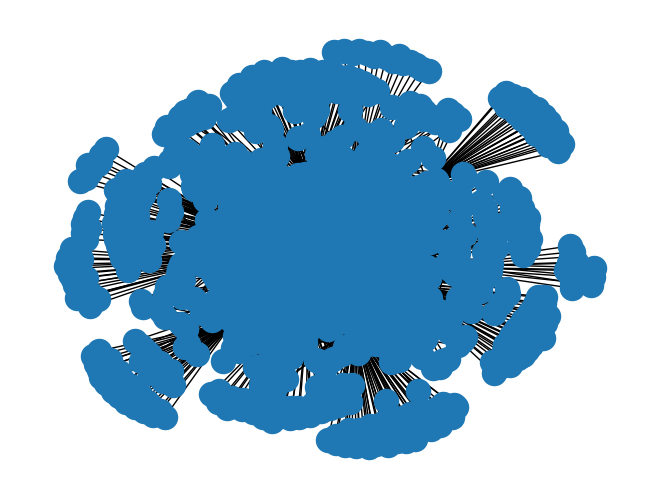

In [ ]:
print(B)
nx.draw(B)

In [ ]:
def is_subgraph(G, H):
    # Проверяем, что все вершины H есть в G
    if not all(node in G.nodes for node in H.nodes):
        return False

    # Проверяем, что все рёбра H есть в G
    if not all(edge in G.edges for edge in H.edges):
        return False

    return True

# Проверка
is_subgraph(P, B)

True

In [ ]:
G_nodes_num = G.number_of_nodes()
F_nodes_num = B.number_of_nodes()
G_edges_num = G.number_of_edges()
F_to_G_ratio = F_nodes_num/G_nodes_num

print('Число узлов: ', G_nodes_num, '\nЧисло рёбер: ', G_edges_num)
print('Число компонент связности:', len(connected_components))
print('Плотность: ', f'{nx.density(G):.4f}')
print('Доля вершин в максимальной по мощности компоненте слабой связности:', f'{F_to_G_ratio:.4f}')


F_node_degrees = [degree[1] for degree in F.degree()]
print(f'Минимальная степень узла: {np.min(F_node_degrees)}',
      f'Максимальная степень узла: {np.max(F_node_degrees)}',
      f'Средняя степень узла: {np.mean(F_node_degrees): .4f}', sep='\n')

rad = nx.radius(B)
diam = nx.diameter(B)

print(f'Радиус графа {rad}',
     f'Диаметр графа {diam}',  sep='\n')

Число узлов:  1899 
Число рёбер:  13838
Число компонент связности: 4
Плотность:  0.0077
Доля вершин в максимальной по мощности компоненте слабой связности: 0.5266
Минимальная степень узла: 1
Максимальная степень узла: 255
Средняя степень узла:  14.6170
Радиус графа 3
Диаметр графа 5


In [ ]:
distances = []



for source, target_dict in nx.all_pairs_shortest_path_length(B):
    for target, distance in target_dict.items():
        if source != target:  # Исключаем расстояние до самой себя
            distances.append(distance)

# Вычисляем 90-й процентиль
percentile_90 = np.percentile(distances, 90)

# Выводим результат
print(f"90-й процентиль расстояний: {percentile_90}")

90-й процентиль расстояний: 4.0


In [ ]:
# Средний кластерный коэфициент
Cl = 0
b_nodes = B.nodes()
for i in b_nodes:
    k_ = B.degree[i]
    neighbors_ = list(B.adj[i])
    subgr_ = nx.induced_subgraph(B, neighbors_)
    L_ = nx.number_of_edges(subgr_)

    if k_ >=2:
        loc_cl = 2*L_/(k_ * (k_ - 1))
    else:
        loc_cl = 0
    Cl += 1/F_nodes_num*loc_cl
print('Средний кластерный коэффициент: ', f'{Cl: .4f}')

Средний кластерный коэффициент:   0.1426


In [ ]:
# Пирсон
A = np.array(nx.adjacency_matrix(B).todense())
k = np.array(B.degree).transpose()
k = k[1]
R1 = 0
R2 = 0
R3 = 0
for i in k:
  R1 = R1 + i
  R2 = R2 + i**2
  R3 = R3 + i**3

Re = 0

for i in range(F_nodes_num):
  for j in range(F_nodes_num):
    #print(i,' ', j)
    Re = Re + A[i][j]*k[i]*k[j]

r = (Re - R2/R1*R2)/(R3 - R2/R1*R2)

print('R1 = ', R1)
print('R2 = ', R2)
print('R3 = ', R3)
print('Re = ', Re)
print('Коэф. ассортативности r = ', f'{r: .4f}')

R1 =  5538
R2 =  399322
R3 =  69925428
Re =  5518296
Коэф. ассортативности r =  -0.5659


### **Без снежного кома:**

In [ ]:
G_nodes_num = G.number_of_nodes()
F_nodes_num = F.number_of_nodes()
G_edges_num = G.number_of_edges()
F_to_G_ratio = F_nodes_num/G_nodes_num

print('Число узлов: ', G_nodes_num, '\nЧисло рёбер: ', G_edges_num)
print('Число компонент связности:', len(connected_components))
print('Плотность: ', f'{nx.density(G):.4f}')
print('Доля вершин в максимальной по мощности компоненте слабой связности:', f'{F_to_G_ratio:.4f}')


F_node_degrees = [degree[1] for degree in F.degree()]
print(f'Минимальная степень узла: {np.min(F_node_degrees)}',
      f'Максимальная степень узла: {np.max(F_node_degrees)}',
      f'Средняя степень узла: {np.mean(F_node_degrees): .4f}', sep='\n')

rad = nx.radius(F)
diam = nx.diameter(F)

print(f'Радиус графа {rad}',
     f'Диаметр графа {diam}',  sep='\n')

Число узлов:  1899 
Число рёбер:  13838
Число компонент связности: 4
Плотность:  0.0077
Доля вершин в максимальной по мощности компоненте слабой связности: 0.9968
Минимальная степень узла: 1
Максимальная степень узла: 255
Средняя степень узла:  14.6170
Радиус графа 4
Диаметр графа 8


In [ ]:
distances = []



for source, target_dict in nx.all_pairs_shortest_path_length(F):
    for target, distance in target_dict.items():
        if source != target:  # Исключаем расстояние до самой себя
            distances.append(distance)

# Вычисляем 90-й процентиль
percentile_90 = np.percentile(distances, 90)

# Выводим результат
print(f"90-й процентиль расстояний: {percentile_90}")


90-й процентиль расстояний: 4.0


In [ ]:
# Средний кластерный коэфициент
Cl = 0
f_nodes = F.nodes()
for i in f_nodes:
    k_ = F.degree[i]
    neighbors_ = list(F.adj[i])
    subgr_ = nx.induced_subgraph(F, neighbors_)
    L_ = nx.number_of_edges(subgr_)

    if k_ >=2:
        loc_cl = 2*L_/(k_ * (k_ - 1))
    else:
        loc_cl = 0
    Cl += 1/F_nodes_num*loc_cl
print('Средний кластерный коэффициент: ', f'{Cl: .4f}')

Средний кластерный коэффициент:   0.1097


In [ ]:
# Пирсон
A = np.array(nx.adjacency_matrix(F).todense())
k = np.array(F.degree).transpose()
k = k[1]
R1 = 0
R2 = 0
R3 = 0
for i in k:
  R1 = R1 + i
  R2 = R2 + i**2
  R3 = R3 + i**3

Re = 0

for i in range(F_nodes_num):
  for j in range(F_nodes_num):
    #print(i,' ', j)
    Re = Re + A[i][j]*k[i]*k[j]

r = (Re - R2/R1*R2)/(R3 - R2/R1*R2)

print('R1 = ', R1)
print('R2 = ', R2)
print('R3 = ', R3)
print('Re = ', Re)
print('Коэф. ассортативности r = ', f'{r: .4f}')

R1 =  27670
R2 =  1539434
R3 =  173559424
Re =  69118102
Коэф. ассортативности r =  -0.1880


### Диапазон существования графа

In [ ]:
# Время существования графа
times = [data['timestamp'] for _, _, data in G.edges(data=True)]
time_max = max(times)
time_min = min(times)


time_percentile_70 = np.percentile(times, 70)

# Выводим результат
print(f"70-й процентиль времени: {time_percentile_70}")

70-й процентиль времени: 1086136611.7


### Создание обучающей выборки

In [ ]:
edu_F = nx.Graph()
test_F = nx.Graph()
# Копирование узлов
edu_F.add_nodes_from(F)
test_F.add_nodes_from(F)
# отбрасывание узлов не входящих в 70-перцентиль
for u, v, data in F.edges(data=True):
  if data['timestamp'] <= time_percentile_70:
    edu_F.add_edge(u, v, timestamp=data['timestamp'])
  else:
    test_F.add_edge(u, v, timestamp=data['timestamp'])



# **PART II**

## **Алгоритмы вычисления топологических признаков**

### Метаданные вычислений

In [ ]:
class CalculationStrategy(ABC):
  '''
  Метаданные вычислений
  '''
  @abstractmethod
  def common_neighbors(*args, **kwargs) -> float:
    pass
  @abstractmethod
  def adamic_adar(*args, **kwargs) -> float:
    pass
  @abstractmethod
  def jaccard_coef(*args, **kwargs) -> float:
    pass
  @abstractmethod
  def preferential_attachment(*args, **kwargs) -> float:
    pass

  @abstractmethod
  def calculate_features(self) -> Tuple[float, float, float, float]:
    pass


### Статические признаки

In [ ]:
class StaticStrategy(CalculationStrategy):

  def common_neighbors(self, nbhs1: set[T], nbhs2: set[T]) -> float:
    return len(nbhs1 & nbhs2)


  def adamic_adar(self, graph: nx.Graph, nbhs1: set[T], nbhs2: set[T]) -> float:
    CN: set[T] = nbhs1 & nbhs2

    result: float = 0

    for nbh in CN:
      result += math.log(len(list(graph.neighbors(nbh))))
    return result


  def jaccard_coef(self, nbhs1: set[T], nbhs2: set[T]) -> float:
    if  nbhs1 | nbhs2 != 0:
      return len(nbhs1 & nbhs2)/len(nbhs1 | nbhs2)
    else:
      return 0


  def preferential_attachment(self, nbhs1: set[T], nbhs2: set[T]) -> float:
    return len(nbhs1) * len(nbhs2)



  def calculate_features(self, graph: nx.Graph, nbhs1: set[T], nbhs2: set[T]) -> dict:
    features = {
            'CN_st': self.common_neighbors(nbhs1, nbhs2),
            'AA_st': self.adamic_adar(graph, nbhs1, nbhs2),
            'JC_st': self.jaccard_coef(nbhs1, nbhs2),
            'PA_st': self.preferential_attachment(nbhs1, nbhs2)
        }
    return features

### Вектор признаков при весе X

In [ ]:
class WeightedVec:
  def __init__(self, weight: float, CN = None, AA = None, JC = None, PA = None, Q0: float = None, Q1: float = None, Q2: float = None, Q3: float = None, Q4: float = None, summarized: float = None, meaned: float = None, varianced: float = None):
    self.weight = weight
    self.CN = CN
    self.AA = AA
    self.JC = JC
    self.PA = PA
    self.Q0 = Q0,
    self.Q1 = Q1,
    self.Q2 = Q2,
    self.Q3 = Q3,
    self.Q4 = Q4,
    self.summarized = summarized,
    self.meaned = meaned,
    self.varianced = varianced



### Рассчет весов

In [ ]:
def w_length(timestamp: int, time_min: int, time_max: int, l: float) -> float:
  return l + (1 - l) * (timestamp - time_min) / (time_max - time_min)

def w_exp(timestamp: int, time_min: int, time_max: int, l: float) -> float:
  return l + (1 - l) * math.e**(3*(timestamp - time_min) / (time_max - time_min) - 1) / (math.e**(3)-1)

def w_root(timestamp: int, time_min: int, time_max: int, l: float) -> float:
  return l + (1 - l) * math.sqrt((timestamp - time_min) / (time_max - time_min))



def calculate_weights(time: int, l) -> dict[str, WeightedVec]:
    weights = {
        'w_length': WeightedVec(w_length(time, time_min, time_max, l)),
        'w_exp' : WeightedVec(w_exp(time, time_min, time_max, l)),
        'w_root':  WeightedVec(w_root(time, time_min, time_max, l))
    }
    return weights

### Темпоральные признаки

In [ ]:
class TemporalStrategy(CalculationStrategy):


  def common_neighbors(self, graph: nx.Graph, node_1: T, node_2: T, weightType: str) -> float:

    CN = set(graph.neighbors(node_1)) & set(graph.neighbors(node_2))
    result = 0

    for node_CN in CN:
      result += graph.get_edge_data(node_1, node_CN)[weightType].weight
      result += graph.get_edge_data(node_2, node_CN)[weightType].weight

    return result


  def adamic_adar(self, graph: nx.Graph, node_1: T, node_2: T, weightType: str) -> float:

    CN = set(graph.neighbors(node_1)) & set(graph.neighbors(node_2))

    result = 0

    for node_CN in CN:
      wtfu = graph.get_edge_data(node_1, node_CN)[weightType].weight
      wtfv = graph.get_edge_data(node_2, node_CN)[weightType].weight
      numenator = wtfv + wtfu

      node_CN_neighbors = graph.neighbors(node_CN)

      wtfz = 0
      for nbh_of_nbh in node_CN_neighbors:
        wtfz += graph.get_edge_data(node_CN, nbh_of_nbh)[weightType].weight
      denominator = math.log(1 + wtfz)

      result += numenator/denominator
    return result


  def jaccard_coef(self, graph: nx.Graph, node_1: T, node_2: T, weightType: str) -> float:
    CN = set(graph.neighbors(node_1)) & set(graph.neighbors(node_2))
    result = 0

    for node_CN in CN:
      numenator = 0
      denumenator = 0

      numenator += graph.get_edge_data(node_1, node_CN)[weightType].weight
      numenator += graph.get_edge_data(node_2, node_CN)[weightType].weight

      node_1_neighbors = graph.neighbors(node_1)
      node_2_neighbors = graph.neighbors(node_2)
      wtfx = 0
      wtfy = 0

      for n_1_nbh in node_1_neighbors:
        wtfx +=  graph.get_edge_data(node_1, n_1_nbh)[weightType].weight
      for n_2_nbh in node_2_neighbors:
        wtfy +=  graph.get_edge_data(node_2, n_2_nbh)[weightType].weight

      denumenator = wtfx + wtfy
      result += numenator/denumenator


    return result


  def preferential_attachment(self, graph: nx.Graph, node_1: T, node_2: T, weightType: str) -> float:
    wtfu = 0
    wtfv = 0


    for n_1_nbh in graph.neighbors(node_1):
      result = graph.get_edge_data(node_1, n_1_nbh)[weightType].weight
      wtfu += result

    for n_2_nbh in graph.neighbors(node_2):
      result = graph.get_edge_data(node_2, n_2_nbh)[weightType].weight
      wtfv += result

    return wtfu * wtfv


  def calculate_features(self, graph: nx.Graph, node_1: T, node_2: T, weightType: str) -> Tuple[float, float, float, float]:
          return (
              self.common_neighbors(graph, node_1, node_2, weightType),
              self.adamic_adar(graph, node_1, node_2, weightType),
              self.jaccard_coef(graph, node_1, node_2, weightType),
              self.preferential_attachment(graph, node_1, node_2, weightType)
          )

### Класс взвешенных рёбер

In [ ]:
class WeightedEdge:
  def __init__(self, node1: T, node2: T, weight: float):
    self.node1 = node1
    self.node2 = node2
    self.weight = weight

### Агрегация событий прошлого

In [ ]:
def calc_aggregation_funcs(edges: List[WeightedEdge]) -> Tuple[float, float, float, float, float, float, float]:

  weights = [edge_info.weight for edge_info in edges]
  # квантили
  fq_idx: int = int(np.floor(len(weights) * 0.25))
  sq_idx: int = int(np.floor(len(weights) * 0.5))
  tq_idx: int = int(np.floor(len(weights) * 0.75))
  zero_quantile: float = weights[0]
  first_quantile: float = weights[fq_idx]
  second_quantile: float = weights[sq_idx]
  third_quantile: float = weights[tq_idx]
  fourth_quantile: float = weights[len(weights) - 1]
  # сумма, среднее, дисперсия
  w_sum:float = sum(weights)
  w_mean:float = sum(weights) / len(weights)
  w_variance:float = np.var(weights)

  return (zero_quantile, first_quantile, second_quantile, third_quantile, fourth_quantile, w_sum, w_mean, w_variance)

## **Вычисления**

### Расчёт статических признаков и весов (I, II A)

In [ ]:
staticStrategy = StaticStrategy()
temporalStrategy = TemporalStrategy()

l = 0.2

for edge in edu_F.edges:
  # Расчёт статических метрик (I)
  edu_F.add_edge(edge[0], edge[1],
             **staticStrategy.calculate_features(graph = edu_F, nbhs1 = set(edu_F.neighbors(edge[0])), nbhs2 = set(edu_F.neighbors(edge[1]))))
  # Расчёт весов (II-A)
  edu_F.add_edge(edge[0], edge[1], **calculate_weights(edu_F.get_edge_data(edge[0], edge[1])['timestamp'], l = l))

### Расчёт темпоральных признаков (II B)

In [ ]:
for edge in edu_F.edges:

  for weightType in ['w_length','w_exp','w_root']:
    current_weight_features: WeightedVec = edu_F.get_edge_data(edge[0], edge[1])[weightType]

    [current_weight_features.CN,
     current_weight_features.AA,
     current_weight_features.JC,
     current_weight_features.PA] = temporalStrategy.calculate_features(edu_F, edge[0], edge[1], weightType)



### Агрегация прошлых событий (II C)

Пункт актуален для мультиграфов

In [ ]:

weightedEdges: List[WeightedEdge] = [WeightedEdge(node1, node2, data['w_length'].weight) for node1, node2, data in edu_F.edges(data = True)]

sortedWeightedEdges = sorted(weightedEdges, key= lambda edge: edge.weight)
for index, edge in enumerate(sortedWeightedEdges):
  slicedList = sortedWeightedEdges[:index + 1]
  weightedInfo = F.get_edge_data(edge.node1, edge.node2)['w_length']
  [weightedInfo.Q0,
   weightedInfo.Q1,
   weightedInfo.Q2,
   weightedInfo.Q3,
   weightedInfo.Q4,
   weightedInfo.summarized,
   weightedInfo.meaned,
   weightedInfo.varianced] = calc_aggregation_funcs(slicedList)


KeyError: 'w_length'

## **Обучение**

### Статический граф

In [ ]:
#статический граф
data_st = []
labels_st = []


for u, v, dt in edu_F.edges(data = True):
  data_st.append([dt['AA_st'], dt['CN_st'], dt['JC_st'], dt['PA_st']])
  labels_st.append(1)  # Ребро существует

# Добавим примеры отсутствующих ребер
non_edges = list(nx.non_edges(edu_F))
for u, v in non_edges:
  cf = staticStrategy.calculate_features(F,set(F.neighbors(u)),set(F.neighbors(v)))
  data_st.append([cf['AA_st'],cf['CN_st'], cf['JC_st'], cf['PA_st']])
  labels_st.append(0)  # Ребро отсутствует

# Преобразуем в DataFrame
df = pd.DataFrame(data_st, columns=['AA_st','CN_st','JC_st','PA_st'])
y = np.array(labels_st)

# Разделение данных на обучающую и тестовую выборки
#X_train, X_test, y_train, y_test = train_test_split(df, y, test_size=0.75)


# Определите размеры выборок
#train_size = int(len(df) * 0.66)  # 75% для обучения
# Разделите данные
X_train = df.iloc[:train_size]  # Первые 75% для обучения
y_train = y[:train_size]         # Целевая переменная для обучающей выборки (индексация NumPy)
X_test = df.iloc[train_size:]     # Остальные 25% для тестирования
y_test = y[train_size:]           # Целевая переменная для тестовой выборки (индексация NumPy)


# Создание и обучение модели логистической регрессии
model = LogisticRegression()
model.fit(X_train, y_train)
# Предсказание на тестовой выборке
y_pred = model.predict(X_test)
# Оценка модели
accuracy = accuracy_score(y_test, y_pred)

In [ ]:
accuracy

0.9999918133040359

### Темпоральный граф

In [ ]:
data_tp = []
labels_tp = []

for u, v, dt in F.edges(data = True):
    tf:WeightedVec = F.get_edge_data(u,v)['w_length']
    data_tp.append([tf.AA, tf.CN, tf.JC, tf.PA])
    #data_tp.append([tf.Q0, tf.Q1, tf.Q2, tf.Q3, tf.Q4, tf.meaned, tf.varianced, tf.summarized, tf.AA, tf.CN, tf.JC, tf.PA])
    labels_tp.append(1)

non_edges = list(nx.non_edges(F))
for u,v in non_edges:
    tf= temporalStrategy.calculate_features(F,u,v,'w_length')
    #print(tf)
    data_tp.append(tf)
    #data_tp.append([c, tf.Q1, tf.Q2, tf.Q3, tf.Q4, tf.meaned, tf.varianced, tf.summarized, tf.AA, tf.CN, tf.JC, tf.PA])
    labels_tp.append(0)


# Преобразуем в DataFrame
#df = pd.DataFrame(data_tp, columns=['q_0','q_1','q_2','q_3','q_4','mid','variance','summ','AA','CN','JC','PA'])
df = pd.DataFrame(data_tp, columns=['AA','CN','JC','PA'])
print(df)
y = np.array(labels_tp)

# Разделение данных на обучающую и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(df, y, test_size=0.2, random_state=42)

# Создание и обучение модели логистической регрессии
model = LogisticRegression()
model.fit(X_train, y_train)
# Предсказание на тестовой выборке
y_pred = model.predict(X_test)
# Оценка модели
accuracy = accuracy_score(y_test, y_pred)


In [ ]:
print(accuracy)

### outdated

In [ ]:
'''# хотим
# G.add_edge(x,y, weight = вычисление веса для ребра, )
# предварительно не нужно
class GraphEdge(Generic[T]):
  def __init__(self, nodes: Tuple[T, T], timestamp: int = None, weight: float = None, static_features_strategy: CalculationStrategy = StaticStrategy(), temporal_features: CalculationStrategy = TemporalStrategy() ):
    self.nodes = nodes
    self.timestamp = timestamp

  def findNeighbors(graph: nx.Graph) -> None:
    self.node_1_neighbors: set[T] = set(graph.neighbors(nodes[0]))
    self.node_2_neighbors: set[T] = set(graph.neighbors(nodes[1]))

# предварительно не нужно
class IGraph(Generic[T]):
  def __init__(self, nx_graph: nx.Graph):
    edgeList: GraphEdge[int] = []
    for edge in nx_graph.edges:
      edgeList.append(nodes = edge, timestamp = nx_graph[edge[0], edge[1]])'''


In [ ]:
"""
Args:
 graph(nx.Graph): граф для которого необходимо посчитать метрику

Returns
  list_of_tuples: [(u, v, CNn)], where CNn - common neighbors number for pair of u&v
"""
'''def CN_tuple(graph):
  CN = []
  F_listed = list(graph.nodes)
  for x in range(0, len(F_listed)):
    for y in range(x+1, len(F_listed)):
      CN.append((F_listed[x], F_listed[y], len(list(nx.common_neighbors(F, F_listed[x], F_listed[y])))))
  return CN'''

In [ ]:
'''
# CN
CN = CN_tuple(F)

# AA
AA = nx.adamic_adar_index(F)

# JC
JC = nx.jaccard_coefficient(F)

# PA
PA = nx.preferential_attachment(F)'''

In [ ]:
'''l = 0.2

time_max = -1
time_min = -1
edges_with_time = []

# Извлечение временных меток, поиск самой большой и маленькой
for edge in F.edges:

    edge_data = F.get_edge_data(edge[0],edge[1])
    timestamp = edge_data['timestamp']
    edges_with_time.append([edge[0], edge[1], timestamp])
    if time_max == -1:
        time_min = timestamp
        time_max = timestamp
    else:
        time_min = min(time_min, timestamp)
        time_max = max(time_max, timestamp)


print('time_min =', time_min)
print('time_max =', time_max)
print('delta_time =', time_max - time_min)'''


In [ ]:
'''## AA temporal


## CN temporal

def CN_temporal(u, v, weighted_edges, graph):

  CN = nx.common_neighbors(graph, u, v)
  result = 0

  for z in CN:
    result += [w[2] for w in weighted_edges if ((w[0] == u and w[1] == z) or (w[0] == z and w[1] == u))][0]
    result += [w[2] for w in weighted_edges if ((w[0] == v and w[1] == z) or (w[0] == z and w[1] == v))][0]

  return result


## JC temporal
def JC_temporal(u, v, weighted_edges, graph):
  CN = nx.common_neighbors(graph, u, v)
  result = 0

  for z in CN:
    numenator = 0
    denumenator = 0

    numenator += [w[2] for w in weighted_edges if ((w[0] == u and w[1] == z) or (w[0] == z and w[1] == u))][0]
    numenator += [w[2] for w in weighted_edges if ((w[0] == v and w[1] == z) or (w[0] == z and w[1] == v))][0]

    u_neighbors = graph.neighbors(u)
    v_neighbors = graph.neighbors(v)
    wtfx = 0
    wtfy = 0
    for x in u_neighbors:
      wtfx += [w[2] for w in weighted_edges if ((w[0] == u and w[1] == x) or (w[0] == x and w[1] == u))][0]
    for y in v_neighbors:
      wtfy += [w[2] for w in weighted_edges if ((w[0] == v and w[1] == y) or (w[0] == y and w[1] == v))][0]
    denumenator = wtfx + wtfy
    result += numenator/denumenator


  return result

## PA temporal

def PA_temporal(u, v, weighted_edges, graph):
  #print(weighted_edges)
  wtfu = 0
  wtfv = 0

  ### для всех соседей в граф.извл
  for z in graph.neighbors(u):
    result = [w[2] for w in weighted_edges if ((w[0] == u and w[1] == z) or (w[0] == z and w[1] == u)) ]
    wtfu += result[0]

  for k in graph.neighbors(v):
    result = [w[2] for w in weighted_edges if ((w[0] == v and w[1] == k) or (w[0] == k and w[1] == v))]
    wtfv += result[0]

  return wtfu * wtfv

### PA_T = PA_temporal(1, 2, weighted_edges=w_length_calculated, graph=F)
print(AA_temporal(1, 2, weighted_edges=w_length_calculated, graph=F))
print(CN_temporal(1, 2, weighted_edges=w_length_calculated, graph=F))
print(JC_temporal(1, 2, weighted_edges=w_length_calculated, graph=F))
print(PA_temporal(1, 2, weighted_edges=w_length_calculated, graph=F))'''

In [ ]:
# Кванитили 0-5
aggregated_vector = calc_aggregation_funcs(weighted_edges=w_length_calculated)

print(aggregated_vector)